# Tabular Playground Series - Jan 2021

https://www.kaggle.com/c/tabular-playground-series-jan-2021

In [1]:
import numpy as np
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

In [2]:
df_train = pd.read_csv("E:/Python Stuff/tabular-playground-series-jan-2021/train.csv")

For this competition, you will be predicting a continuous target based on a number of feature columns given in the data. All of the feature columns are continuous.

In [3]:
df_train.head()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,target
0,1,0.670390,0.811300,0.643968,0.291791,0.284117,0.855953,0.890700,0.285542,0.558245,0.779418,0.921832,0.866772,0.878733,0.305411,7.243043
1,3,0.388053,0.621104,0.686102,0.501149,0.643790,0.449805,0.510824,0.580748,0.418335,0.432632,0.439872,0.434971,0.369957,0.369484,8.203331
2,4,0.834950,0.227436,0.301584,0.293408,0.606839,0.829175,0.506143,0.558771,0.587603,0.823312,0.567007,0.677708,0.882938,0.303047,7.776091
3,5,0.820708,0.160155,0.546887,0.726104,0.282444,0.785108,0.752758,0.823267,0.574466,0.580843,0.769594,0.818143,0.914281,0.279528,6.957716
4,8,0.935278,0.421235,0.303801,0.880214,0.665610,0.830131,0.487113,0.604157,0.874658,0.863427,0.983575,0.900464,0.935918,0.435772,7.951046


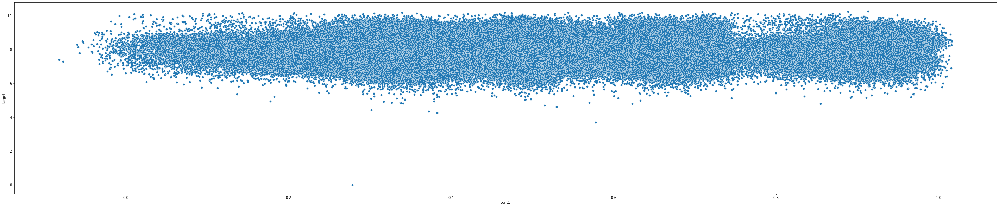

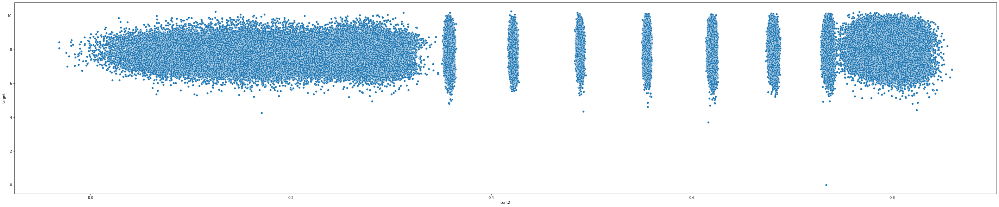

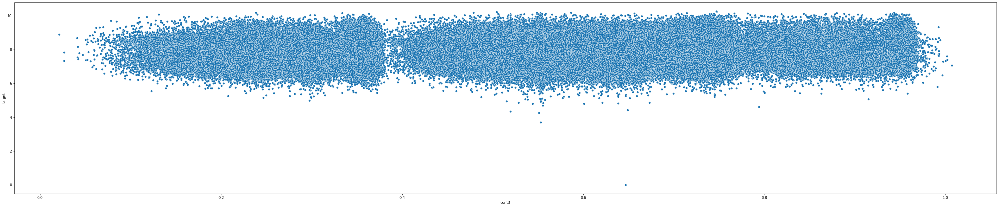

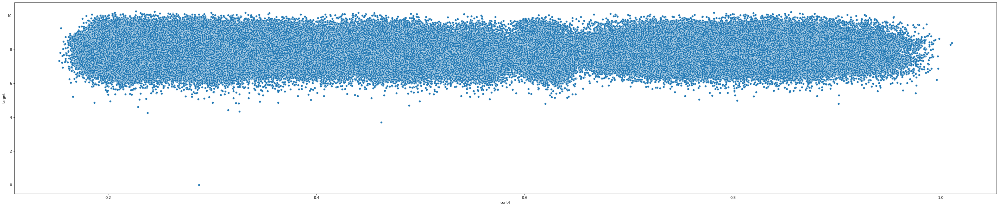

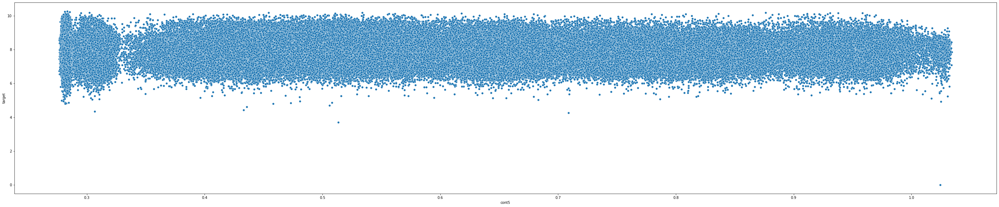

...

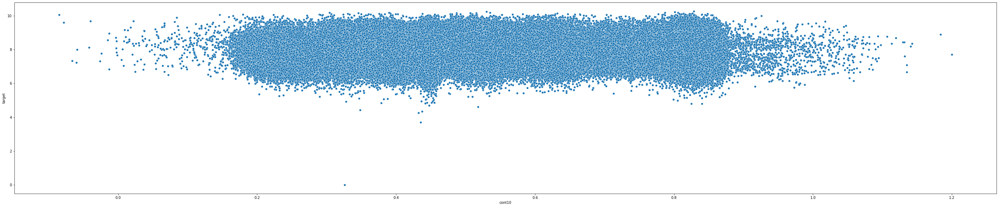

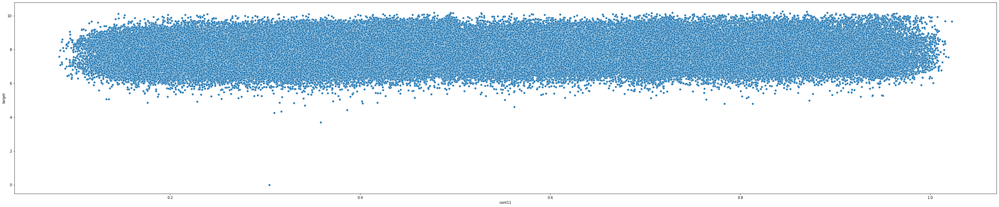

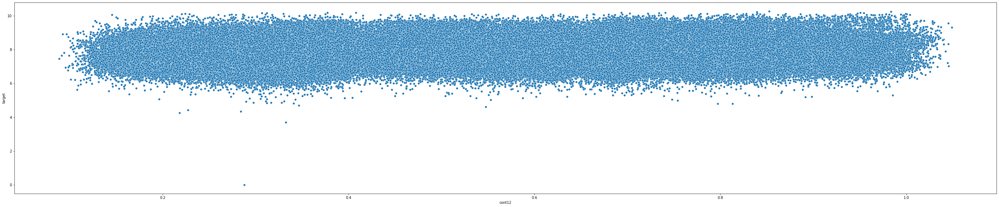

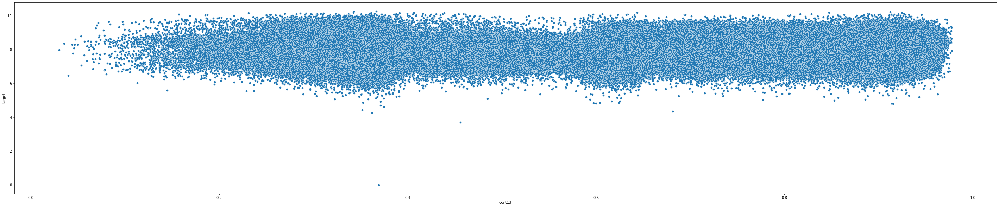

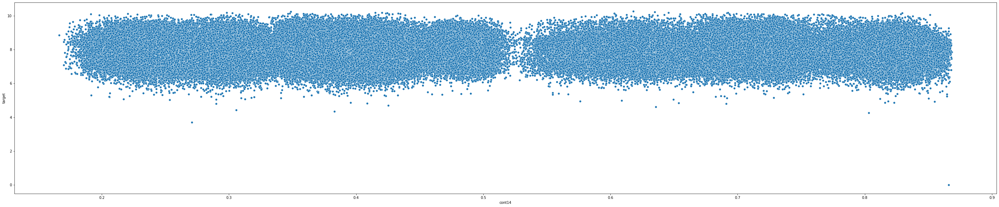

In [4]:
for i in range(1,15):
    plt.figure(figsize=(50, 10))
    sns.scatterplot(x=df_train['cont{}'.format(i)], y=df_train['target'])
    plt.show()

In [5]:
X = df_train.drop(columns=["target","id"])
y = df_train["target"]

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [7]:
train_data = lgb.Dataset(data=X_train, label=y_train)
test_data = lgb.Dataset(data=X_test, label=y_test)

In [8]:
params = {'objective':'regression', "metric":"rmse", "learning_rate":0.005, "num_round":10000}

In [9]:
clf = lgb.train(train_set=train_data,
                 params=params,
                 valid_sets=[train_data, test_data], 
                 valid_names=['Train', 'Test'],
                 verbose_eval=2000
                )

C:\ProgramData\Anaconda3\lib\site-packages\lightgbm\engine.py:151: UserWarning: Found `num_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007156 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3570
[LightGBM] [Info] Number of data points in the train set: 225000, number of used features: 14
[LightGBM] [Info] Start training from score 7.906311
[2000]	Train's rmse: 0.693727	Test's rmse: 0.705316
[4000]	Train's rmse: 0.6843	Test's rmse: 0.703109
[6000]	Train's rmse: 0.676405	Test's rmse: 0.702181
[8000]	Train's rmse: 0.669452	Test's rmse: 0.701807
[10000]	Train's rmse: 0.662947	Test's rmse: 0.701628
